In [1]:
!pip install segmentation_models_pytorch -q

In [2]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from PIL import Image
import segmentation_models_pytorch as smp
import cv2
import os
import numpy as np
import random
from tqdm import tqdm
import copy
from skimage.util import random_noise
import matplotlib.pyplot as plt
from datetime import datetime

In [3]:
import torch
import cv2
import os

from sklearn.model_selection import train_test_split


def default_aug(image, mask):
    return image, mask


def default_preprocessing(image):
    return torch.from_numpy(image).permute(2, 0, 1).float()


class SegmentationDataset(torch.utils.data.Dataset):
    def __init__(self,
                 tiles,
                 masks,
                 augmentations,            # Аугментации
                 preprocessing   # Обработка данных для модели
                 ):
        self.has_mask = masks is not None
        self.tiles = tiles
        self.masks = masks
        self.augmentations = augmentations
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.tiles)

    def get_item(self, idx):
        image = self.tiles[idx]
        mask = None
        if self.has_mask:
            mask = self.masks[idx]
        image, mask = self.augmentations(image, mask)
        if self.has_mask:
            mask = torch.from_numpy(mask).float()
        before_preprocessing = image
        image = self.preprocessing(image)

        return image, mask, before_preprocessing

    def __getitem__(self, idx):
        image, mask, before_preprocessing = self.get_item(idx)
        if self.has_mask:
            return image, mask
        return image


def get_tiles(tile_size,
              path_to_pics,
              path_to_masks=None,                   # None, если нет лейблов
              ):
    images = []
    masks = None

    for root, dirs, files in os.walk(path_to_pics):
        for file in sorted(files):
            img = cv2.imread(os.path.join(root, file))
            h, w, _ = img.shape

            for h_coord in range(0, h // tile_size):
                for w_coord in range(0, w // tile_size):
                    y = h_coord * tile_size
                    x = w_coord * tile_size
                    images.append(img[y: y + tile_size, x: x + tile_size])

    # Загрузка масок
    if path_to_masks is not None:
        masks = []
        for root, dirs, files in os.walk(path_to_masks):
            for file in sorted(files):
                mask = cv2.imread(os.path.join(root, file))
                mask = (mask[:, :, 0] > 0).astype('uint8')
                h, w = mask.shape

                for h_coord in range(0, h // tile_size):
                    for w_coord in range(0, w // tile_size):
                        y = h_coord * tile_size
                        x = w_coord * tile_size
                        masks.append(mask[y: y + tile_size, x: x + tile_size])

    return images, masks


def get_datasets(tile_size,
                 path_to_pics,
                 path_to_masks=None,
                 augmentations=default_aug,            # Аугментации
                 preprocessing=default_preprocessing   # Обработка данных для модели
                 ):
    tiles, masks = get_tiles(tile_size, path_to_pics, path_to_masks)
    train_tiles, val_tiles, train_masks, val_masks = train_test_split(tiles, masks, test_size=0.2, random_state=42)
    train_dataset = SegmentationDataset(train_tiles, train_masks, augmentations, preprocessing)
    val_dataset = SegmentationDataset(val_tiles, val_masks, default_aug, preprocessing)
    return train_dataset, val_dataset


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [33]:
BACKBONE = 'resnet50'
PRETRAIN = "imagenet"
preprocessing_fn = smp.encoders.get_preprocessing_fn(BACKBONE, pretrained=PRETRAIN)

def preprocessing(image):
    image = preprocessing_fn(image)
    return torch.from_numpy(image).permute(2, 0, 1).float()

def augmentations(image, mask):
    '''if random.randint(1, 2) == 1:
        image = cv2.flip(image, 1)
        mask = cv2.flip(mask, 1)
    if random.randint(1, 2) == 1:
        image = cv2.flip(image, 0)
        mask = cv2.flip(mask, 0)'''
    ch_col = random.randint(80, 120) / 100
    image = image.astype('float64') * ch_col
    image[image > 255] = 255
    image = image.astype('uint8')
    return image, mask

dataset_train, dataset_val = get_datasets(256,
                                          '/kaggle/input/digital-breakthrough-skoltech-infrastructure/train/images',
                                          '/kaggle/input/digital-breakthrough-skoltech-infrastructure/train/masks',
                                          augmentations=augmentations,
                                          preprocessing=preprocessing)

In [34]:
dataloader_train = DataLoader(dataset_train, batch_size=24, shuffle=True)
dataloader_val = DataLoader(dataset_val, batch_size=24, shuffle=False)

In [35]:
model = smp.Unet(
    encoder_name=BACKBONE,
    in_channels=3,
    classes=1,
    activation='sigmoid'
)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 53.5MB/s]


In [59]:
import torch
import numpy
import wandb
from tqdm import tqdm

TEAM_NAME = "knife_team"
PROJECT_NAME = "building-segmentation"


class SegmentationModel:
    def __init__(self, model: torch.nn.Module, model_name: str = "model", device="cuda"):
        self.device = device
        self.model = model.to(device)
        self.model_name = model_name

    def __call__(self, x):
        return self.model(x)

    def train(self, loss, train_loader, val_loader,
              metrics: dict, optimizer, target_metric="f1",
              epochs=100, wandb_logging=False, path_to_save_model=None,
              verbose=True):

        if wandb_logging:
            run = wandb.init(
                entity=TEAM_NAME,
                project=PROJECT_NAME,
                config={
                    "architecture": self.model_name,
                    "epochs": epochs,
                    "batch_size": train_loader.batch_size,
                    "optimizer": optimizer.__class__.__name__,
                    "loss": loss.__class__.__name__,
                    "lr": optimizer.param_groups[0]['lr'],
                    "target_metric": target_metric,
                }
            )

        best_metric = 0
        train_logs_list, valid_logs_list = [], []

        for epoch in range(1, epochs + 1):
            self.model.train()
            results = {}
            for metric_name, metric in metrics.items():
                results[metric_name] = []
            results['train_loss'] = []

            pbar = tqdm(enumerate(train_loader), total=len(train_loader))
            pbar.set_description(f"Epoch {epoch}")

            for batch_idx, (data, target) in pbar:
                data, target = data.to(self.device), target.to(self.device).unsqueeze(1)
                optimizer.zero_grad()
                output = self.model(data)
                loss_value = loss(output, target)
                loss_value.backward()
                optimizer.step()

                results['train_loss'].append(loss_value.item())
                for metric_name, metric in metrics.items():
                    results[metric_name].append(metric(output, target).detach().cpu().item())

                pbar.set_postfix({
                    "loss": numpy.mean(results['train_loss']),
                })

            results['train_loss'] = numpy.mean(results['train_loss'])
            for metric_name, metric in metrics.items():
                results[metric_name] = numpy.mean(results[metric_name])

            train_logs_list.append(results)
            if verbose:
                print(f'Train logs: {results}')

            results = {}
            for metric_name, metric in metrics.items():
                results[metric_name] = []
            results['val_loss'] = []

            self.model.eval()
            with torch.no_grad():
                for batch_idx, (data, target) in tqdm(enumerate(val_loader), total=len(val_loader)):
                    data, target = data.to(self.device), target.to(self.device).unsqueeze(1)
                    output = self.model(data)
                    loss_value = loss(output, target)
                    
                    results['val_loss'].append(loss_value.item())
                    for metric_name, metric in metrics.items():
                        results[metric_name].append(metric(output, target).detach().cpu().item())

            results['val_loss'] = numpy.mean(results['val_loss'])
            for metric_name, metric in metrics.items():
                results[metric_name] = numpy.mean(results[metric_name])
            valid_logs_list.append(results)

            if verbose:
                print(f'Val logs: {results}')

            if results[target_metric] > best_metric:
                print(f'New best model! Val {target_metric}: {results[target_metric]}')
                best_metric = results[target_metric]
                if path_to_save_model is not None:
                    model_path = os.path.join(path_to_save_model, f'{self.model_name}_{round(best_metric, 4)}.pth')
                    torch.save(self.model.state_dict(), model_path)

            if wandb_logging:
                wandb.log({"train_loss": train_logs_list[-1]['train_loss'],
                           "val_loss": valid_logs_list[-1]['val_loss']})

                for metric_name, metric in metrics.items():
                    wandb.log({f"train_{metric_name}": train_logs_list[-1][metric_name],
                               f"val_{metric_name}": valid_logs_list[-1][metric_name]})

        if wandb_logging:
            run.finish()

        return train_logs_list, valid_logs_list

    def predict(self, test_loader):
        self.model.eval()
        with torch.no_grad():
            predictions = []
            for batch_idx, data in tqdm(enumerate(test_loader), total=len(test_loader)):
                try:
                    data, target = data
                    data, target = data.to(self.device), target.to(self.device).unsqueeze(1)
                except TypeError:
                    data = data.to(self.device)
                output = self.model(data).detach().cpu().numpy()
                for part in output:
                    predictions.append(part[0])

        return predictions

In [60]:
model_train = SegmentationModel(model, 'unet-resnet50')

In [40]:
#from sklearn.metrics import f1_score
from segmentation_models_pytorch import utils

f1_score = smp.utils.metrics.Fscore(threshold=0.5)
def my_f1_score(y_pred, y_true):
    score = (f1_score(y_pred, y_true) + f1_score(1 - y_pred, 1 - y_true)) / 2
    return score

def my_dice_loss(p, y):
    loss = 1 - (2 * (p * y).sum() + 1) / (p.sum() + y.sum() + 1)
    return loss

#criterion = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)
criterion = my_dice_loss
optimizer = optim.Adam(model.parameters(), lr=3e-4)
metrics = {
    'f1': my_f1_score,
    #'iou': smp.utils.metrics.IoU(threshold=0.5)
}
model_train.train(criterion, dataloader_train, dataloader_val, metrics, optimizer, wandb_logging=True,
                 path_to_save_model='/kaggle/working/')

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Epoch 1: 100%|██████████| 404/404 [02:20<00:00,  2.88it/s, loss=0.526]


Train logs: {'f1': 0.7660635677304598, 'train_loss': 0.5256084165360668}


100%|██████████| 101/101 [00:15<00:00,  6.64it/s]


Val logs: {'f1': 0.8252891626688513, 'val_loss': 0.3535799283792477}
New best model! Val f1: 0.8252891626688513


Epoch 2: 100%|██████████| 404/404 [02:17<00:00,  2.94it/s, loss=0.346]


Train logs: {'f1': 0.8131929718621886, 'train_loss': 0.3461485224785191}


100%|██████████| 101/101 [00:15<00:00,  6.69it/s]


Val logs: {'f1': 0.835998016418797, 'val_loss': 0.3056304472507817}
New best model! Val f1: 0.835998016418797


Epoch 3: 100%|██████████| 404/404 [02:16<00:00,  2.96it/s, loss=0.306]


Train logs: {'f1': 0.8349946340416917, 'train_loss': 0.3062186645399226}


100%|██████████| 101/101 [00:14<00:00,  6.81it/s]


Val logs: {'f1': 0.8456004858016968, 'val_loss': 0.2875785137167071}
New best model! Val f1: 0.8456004858016968


Epoch 4: 100%|██████████| 404/404 [02:14<00:00,  3.00it/s, loss=0.288]


Train logs: {'f1': 0.8445644846352021, 'train_loss': 0.2884883339157199}


100%|██████████| 101/101 [00:14<00:00,  6.88it/s]


Val logs: {'f1': 0.836950954824391, 'val_loss': 0.30587616238263576}


Epoch 5: 100%|██████████| 404/404 [02:15<00:00,  2.98it/s, loss=0.292]


Train logs: {'f1': 0.8426873056900384, 'train_loss': 0.29196562935220133}


100%|██████████| 101/101 [00:14<00:00,  6.83it/s]


Val logs: {'f1': 0.8536023202508983, 'val_loss': 0.271734083643054}
New best model! Val f1: 0.8536023202508983


Epoch 6: 100%|██████████| 404/404 [02:15<00:00,  2.98it/s, loss=0.269]


Train logs: {'f1': 0.8550691908538932, 'train_loss': 0.26916029311642786}


100%|██████████| 101/101 [00:14<00:00,  6.85it/s]


Val logs: {'f1': 0.819599185249593, 'val_loss': 0.3313485655454126}


Epoch 7: 100%|██████████| 404/404 [02:15<00:00,  2.99it/s, loss=0.268]


Train logs: {'f1': 0.8556648869030546, 'train_loss': 0.26813367850119524}


100%|██████████| 101/101 [00:14<00:00,  6.88it/s]


Val logs: {'f1': 0.8605804584994174, 'val_loss': 0.2594990812905944}
New best model! Val f1: 0.8605804584994174


Epoch 8: 100%|██████████| 404/404 [02:15<00:00,  2.99it/s, loss=0.252]


Train logs: {'f1': 0.8643911945642812, 'train_loss': 0.25205653094419156}


100%|██████████| 101/101 [00:14<00:00,  6.86it/s]


Val logs: {'f1': 0.8382541389748601, 'val_loss': 0.2987754333137286}


Epoch 9: 100%|██████████| 404/404 [02:15<00:00,  2.99it/s, loss=0.269]


Train logs: {'f1': 0.854873444626827, 'train_loss': 0.26943065949005657}


100%|██████████| 101/101 [00:14<00:00,  6.80it/s]


Val logs: {'f1': 0.8636098126373669, 'val_loss': 0.253544275713439}
New best model! Val f1: 0.8636098126373669


Epoch 10: 100%|██████████| 404/404 [02:15<00:00,  2.97it/s, loss=0.244]


Train logs: {'f1': 0.8689673317245917, 'train_loss': 0.24361296027603715}


100%|██████████| 101/101 [00:14<00:00,  6.80it/s]


Val logs: {'f1': 0.8629151836480244, 'val_loss': 0.2542976424245551}


Epoch 11: 100%|██████████| 404/404 [02:15<00:00,  2.98it/s, loss=0.238]


Train logs: {'f1': 0.871802751233082, 'train_loss': 0.2383992950810064}


100%|██████████| 101/101 [00:14<00:00,  6.76it/s]


Val logs: {'f1': 0.8658620243025298, 'val_loss': 0.24933802845454453}
New best model! Val f1: 0.8658620243025298


Epoch 12: 100%|██████████| 404/404 [02:16<00:00,  2.96it/s, loss=0.238]


Train logs: {'f1': 0.872137922314134, 'train_loss': 0.2377971754510804}


100%|██████████| 101/101 [00:14<00:00,  6.85it/s]


Val logs: {'f1': 0.8658632535745602, 'val_loss': 0.25035691851436503}
New best model! Val f1: 0.8658632535745602


Epoch 13:  61%|██████    | 246/404 [01:23<00:53,  2.96it/s, loss=0.236]


KeyboardInterrupt: 

In [61]:
predictions = model_train.predict(dataloader_val)

100%|██████████| 101/101 [00:15<00:00,  6.71it/s]


In [65]:
def visualize(figsize=(20, 10), **images):
    """
    :param figsize: A tuple (width, height) specifying the size of the figure. Default is (20, 10).
    :param images: Keyword arguments where the key is the name of the image and the value is the corresponding image data.
    :return: None

    This method takes in multiple images and displays them in a grid layout using matplotlib. It supports numpy arrays and torch tensors as image data. The figsize parameter allows you to specify the size of the figure. Each image will be displayed with its corresponding name as the title.

    Examples:
        visualize(figsize=(10, 5), image1=image_data1, image2=image_data2)
    """
    n_images = len(images)
    plt.figure(figsize=figsize)
    for idx, (name, image) in enumerate(images.items()):

        if isinstance(image, torch.Tensor):
            image = image.detach().cpu().numpy()
            if image.shape[0] == 1:
                image = image[0]

            if len(image.shape) == 3:
                image = image.transpose(1, 2, 0)

        if not isinstance(image, np.ndarray):
            raise ValueError(f'Image must be numpy array or torch tensor. Got {type(image)}')
        if image.shape[-1] == 1:
            image = image[:, :, 0]

        plt.subplot(1, n_images, idx + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(name.replace('_', ' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

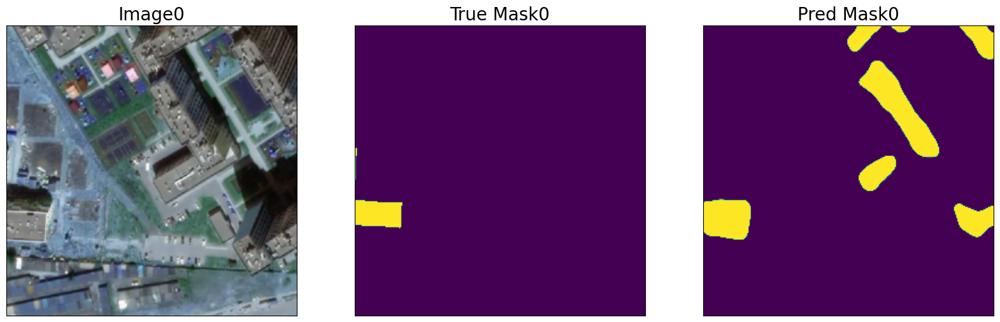

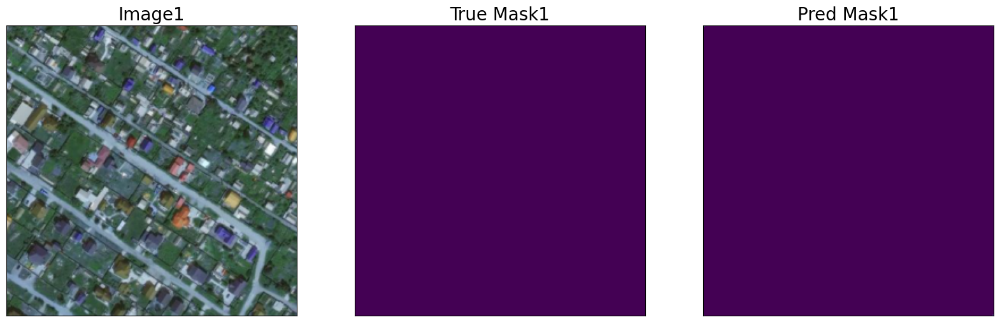

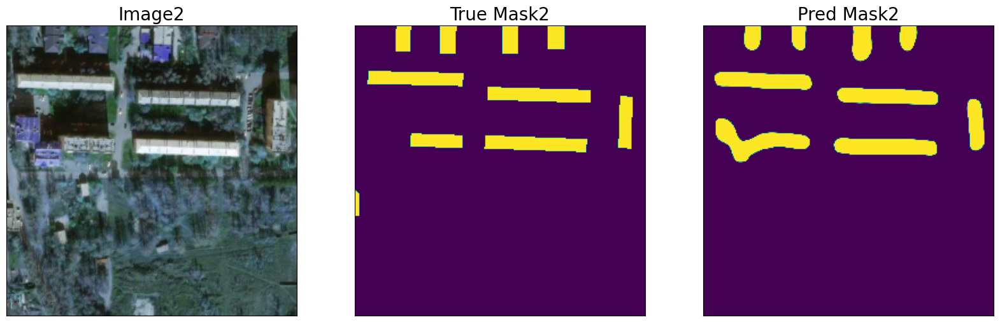

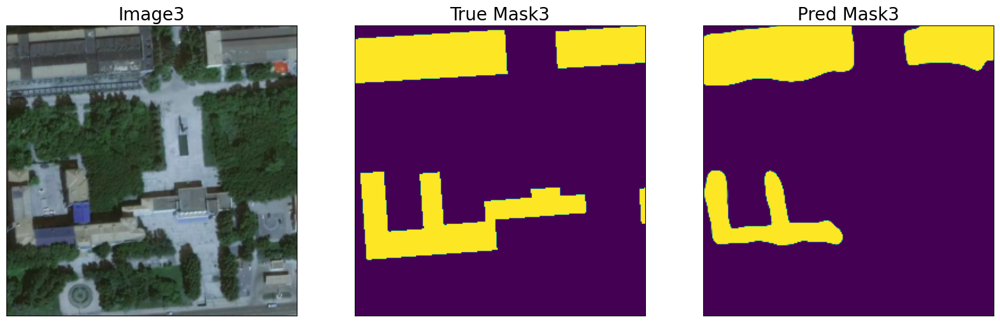

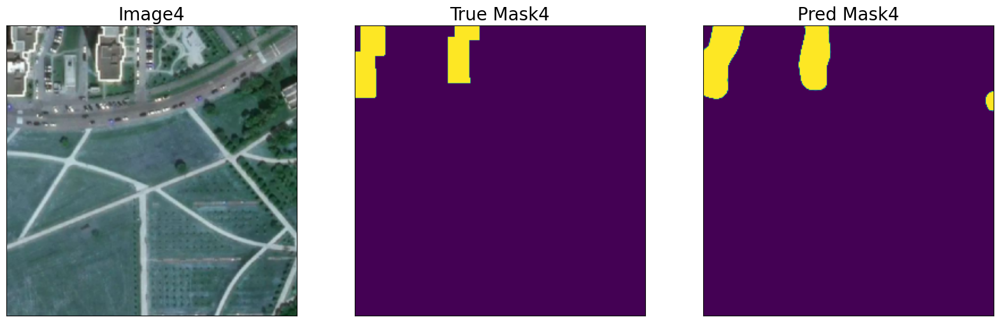

...

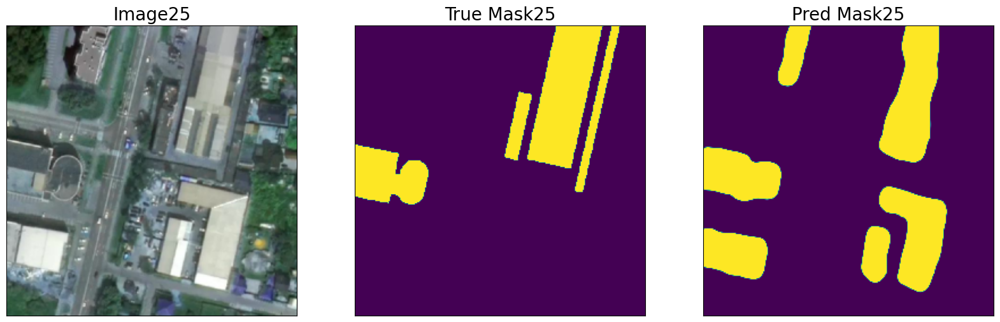

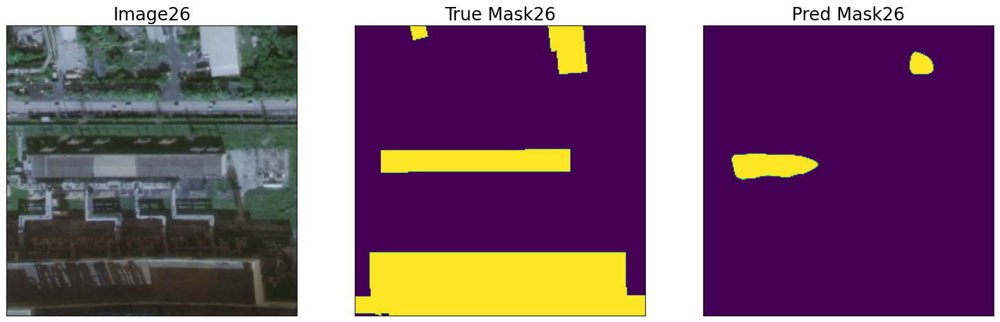

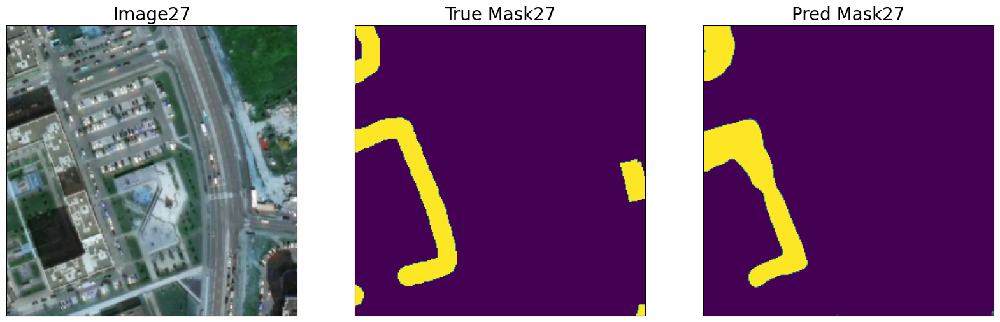

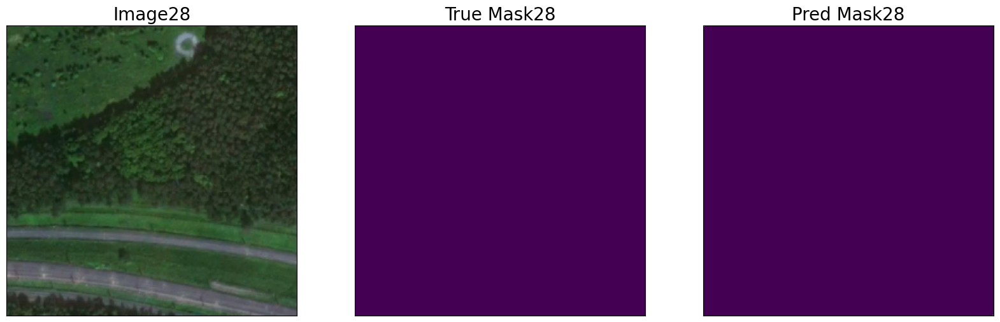

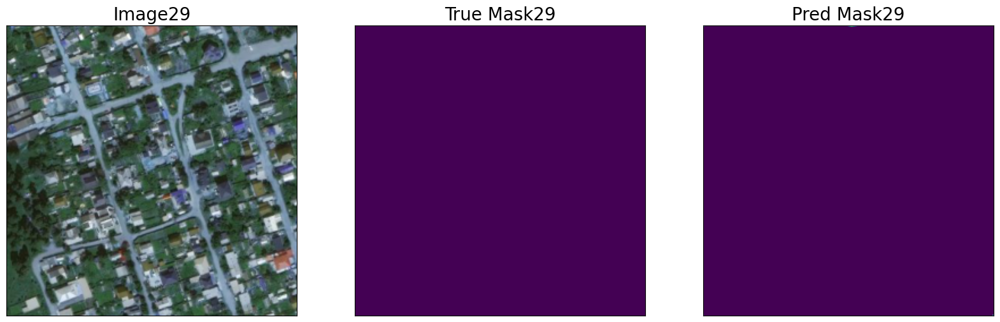

In [93]:
for i in range(30):
    params_vis = {}
    params_vis[f'image{i}'] = dataset_val.get_item(i)[2]
    params_vis[f'true_mask{i}'] = dataset_val.get_item(i)[1]
    params_vis[f'pred_mask{i}'] = predictions[i]
    visualize(figsize=(20, 10), **params_vis)